# Introduction: Webscraping Zillow
_Author: Nathan Robertson_

To begin this project, we need to build a webscraper that can scrape data for all active Zillow listings in the continental United States. We can break this down into a series of subproblems, such as:


<div class="alert alert-info">
    <li>How can we access the collective Zillow search results of the continental United States?</li>
    <li>How can we iterate through multiple pages of search when a certain area has more than one page?</li>
    <li>How can we handle when there are more listings in an area then will be shown on search? (Example: NYC)</li>
    <li>How can we scrape all of the relevant information from a Zillow listing page?</li>
    <li>What can we do to limit the time it takes to run this webscraper, without getting blocked by Zillow?</li>
</div>

By the end of this Jupyter notebook, we should have a dataset of Zillow listings from across the United States that we can then move forward into data cleaning.

### Step 0: Import Packages.

To get started, we'll import what we need to achieve this task. Packages included will support:

<div class="alert alert-info">
    <li>Scraping and extracting insights out of URLs pointing to Zillow's listings and search result pages.</li>
    <li>Adding some random time.sleep calls to prevent our scraper getting blocked by Zillow for too many calls.</li>
    <li>Data visualization that will help us visually work through some of the sub tasks.</li>
    <li>Reverse geocoding to extract relevant information from latitude / longitude coordinates.</li>
</div>

In [1]:
# For scraping and wrangling data.
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import json
from urllib.parse import urlparse, parse_qs, urlencode, urlunparse
from itertools import chain
import re

# For building human like randomness into the webscraper.
import time
import random

# For data visualization
import plotly.express as px
from IPython.display import Image

# Geo-encoding
from geopy.geocoders import Nominatim
import reverse_geocode
import collections
from geopy.exc import GeocoderTimedOut, GeocoderUnavailable, GeocoderServiceError

# For tracking progress.
from tqdm import tqdm
from IPython.display import clear_output

# Step 1: Generate links to Zillow Search Results for Scraping

Our entry point into getting the data we need is in Zillow's search result pages. The search result page allows us to receive a list of Zillow listings, and fetch URLs to those listings that can then give us all the data we need.

<div class="alert alert-info">
<i>Screenshot: an example of what a user sees when they go to a search results page on Zillow.com. We want to scrape links from each of the cards on the right that will give us all of the data on the listing.</i>
</div>

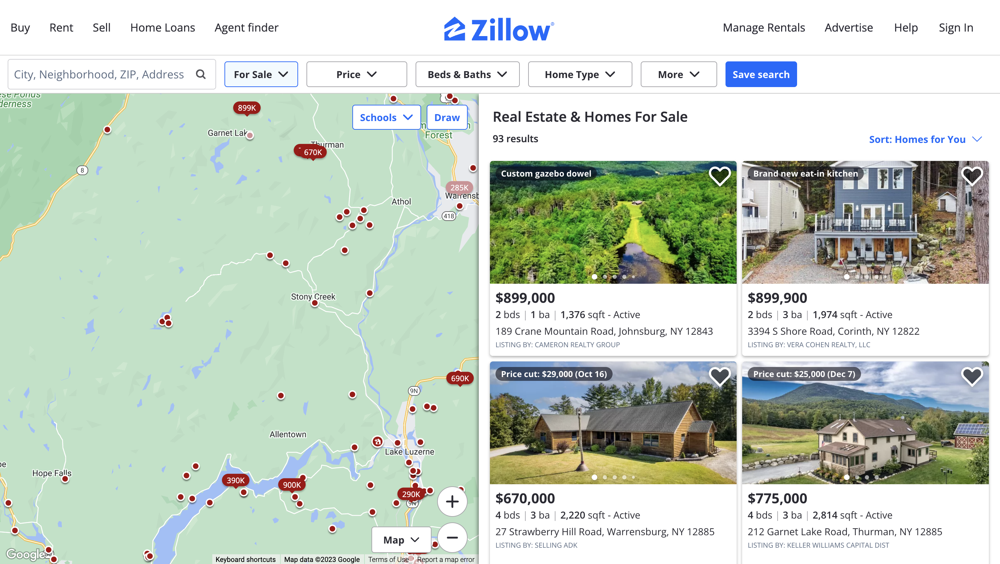
    
However, Zillow doesn't have one page that lists all of the tens of thousands of listings that are active. The highest region you can search for is for a state (Oklahoma, Massachusetts, Colorado). But even if you go to these search pages, Zillow caps the number of results returned to 500.


<div class="alert alert-info">
<i>Screenshot: An example of the highest geographic area you can search for in the United States, and how it limits search results to 500. We need a way to access all of the results across the continental United States, and to detect when the results are being limited by Zillow.</i></div>

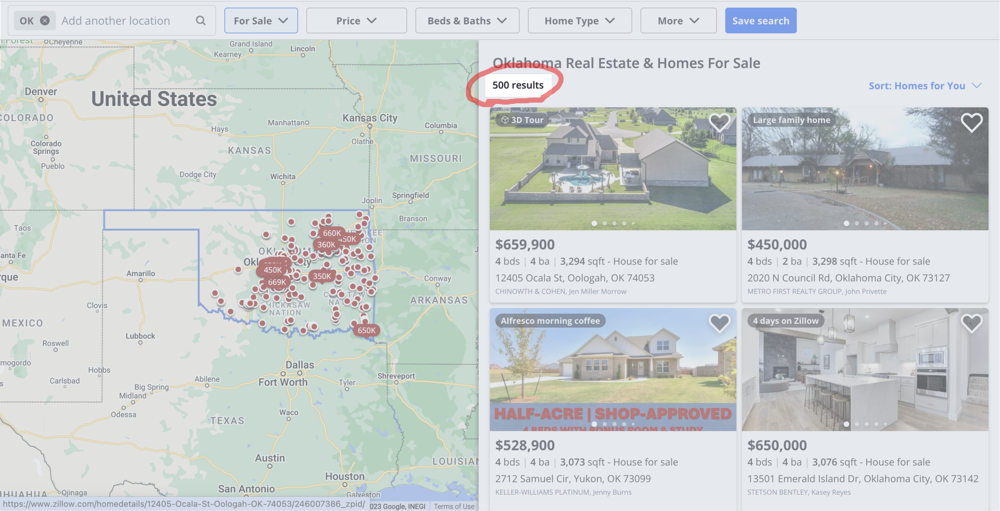

This is perfectly reasonable - Zillow wants their users to narrow down to a small number of listings that meet their preferences and take the next step (go to an open house, contact the agent, schedule a viewing). So to get all of the listings, I'll need to break up the United States into a grid and find ways to search each of those grids.

<div class="alert alert-info">
<i>(Screenshot: a conceptual drawing of the problem to solve. I need to break the United States into a grid of small boxes, and search for Zillow listings in each one.)</i></div>

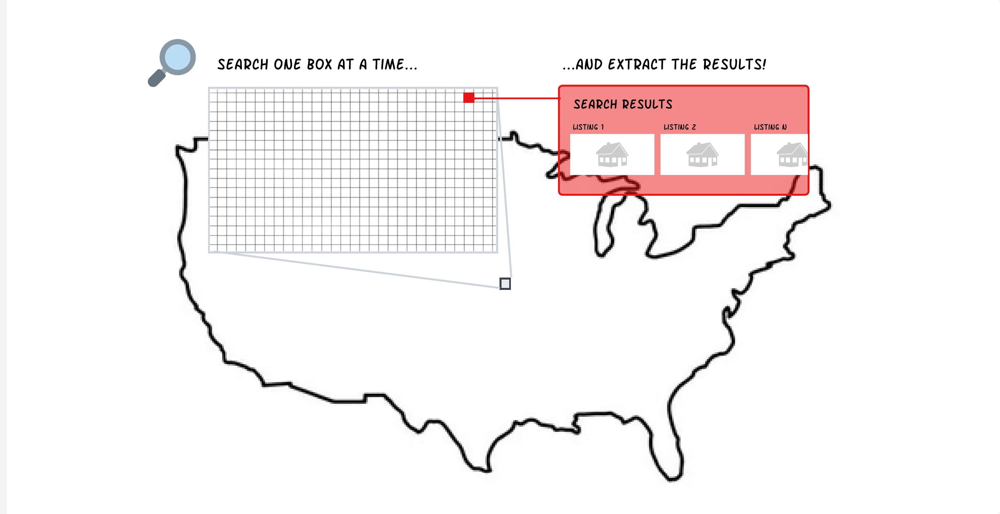

Fortunately, this is possible! Within Zillow's search results URLs, it accepts parameters that helps inform a mapbox filter of the listings in view. I can use this to great a grid of 19 square mile boxes across the United States.

<div class="alert alert-info">
<i>Screenshot: an example of what the Zillow search results URLs look like, and how we can control the URL parameters to slice the Continental United States into a series of small mapboxes.</i></div>

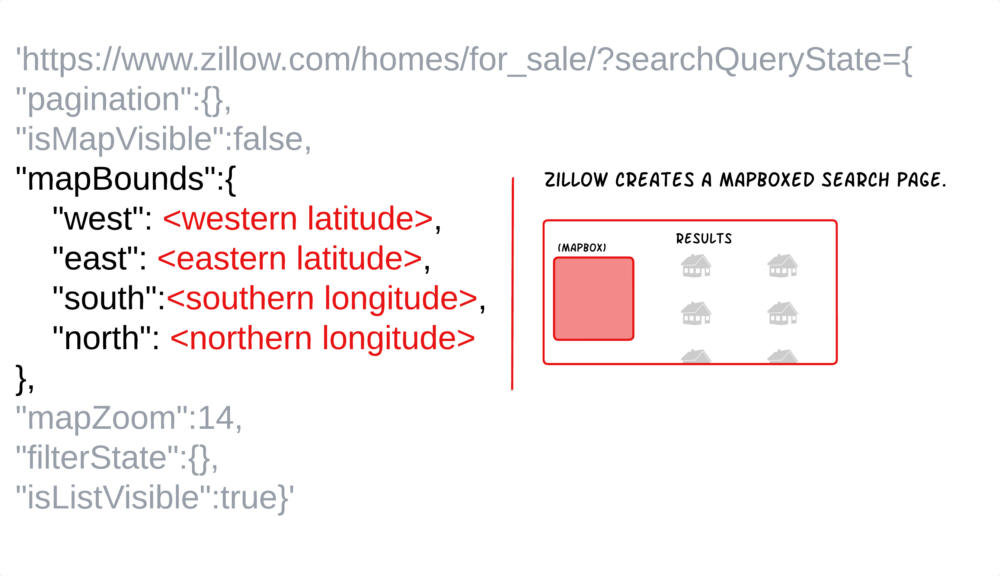

The webscraper is going to be the slowest part of this project, so I want to minimize the number of mapboxes it looks at that have no results. Building a massive square shaped bounding box over the United States includes a lot of irrelevant space over the Atlantic and Pacific ocean (and, also irrelevant for the purposes of our project, Canada and Mexico).

<div class="alert alert-info">
<i>Screenshot: the shaded areas we don't want to spend anytime trying to scrape. So, we need a way to filter out those areas to shave off time for a scraper that will move very slowly.</i></div>

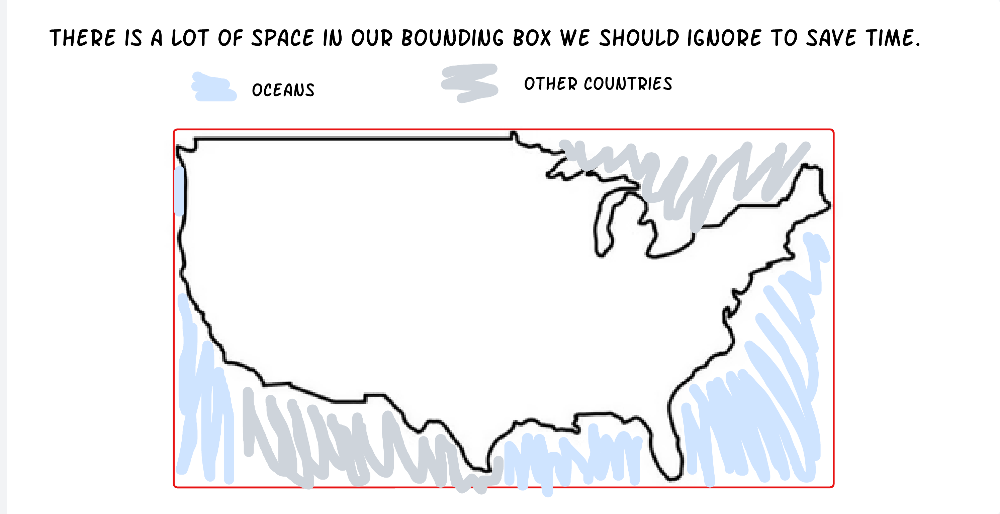


So I want to generate a set of mapboxes that comes _as close as possible_ to covering the United States with the _minimum number_ of mapboxes. This could shave days (or even weeks) off the time it takes to scrape this data.

<div class="alert alert-info">
<i>Screenshot: the area we want to scrape. If we can figure out how to build a bounding box that looks like this, then we can jump into scraping data!</i></div>

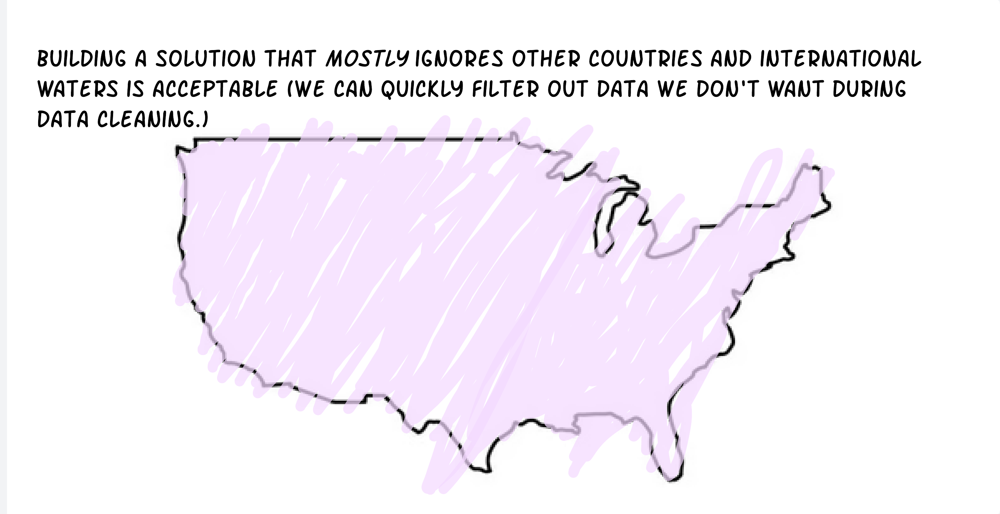

I'll start with a nearest neighbors approach to determining which mapboxes I should include -- if that doesn't work, I'll do something a little more comprehensive (albeit slower).

### 1.1: create initial bounding box.

I'll create a large, square bounding box using the max/min latitudes and longitudes of United States, and then break that up into a series of mapboxes (about 19 square miles per mapbox). I'll accomplish this with the function `generate_mapboxes`.

I'll also go ahead and execute a fast, but imprecise, method of trying to filter out which mapboxes are in the continental US, and which I can avoid. I'll acomplish this with the library `reverse_geocode` in the function `check_country`.

In [2]:
"""
check_country: 

Using a nearest neighbors approach from reverse geocode, determine
if a lat/lng coordinate pair is in the United States.

    Args:
      Coordinates: a list of lat-lng tuples.
    
    Returns: 
      True if the coordinate is estimated to be in the United States, False if not. 
      This is fast, but relies on a nearest neighbors approach
      that leads to errors near borders, and poor performance in international
      waters (where the most filtering help is needed).
"""
def check_country(coordinates):
    locationData = reverse_geocode.search(coordinates)
    country = locationData[0]['country']

    if country == 'United States':
        return True
    else:
        return False

In [3]:
"""
generate_mapviews: 

Generates a list of mapboxes to append to a DataFrame titled mapbox_df.

    Args:
      None
    
    Returns:
      pandas DataFrame with approximately 150,000 rows of tiny mapboxes of the United States.
      Uses a large bounded box, with a high % of space estimated to be Mexico, Canada, or 
      international waters. It stores the edges of each mapbox, the center of each mapbox, 
      and an estimate of whether that coordinate is in the United States (see description 
      of the limitations of this approach in `check_country`.)
"""

def generate_mapboxes():
    # Bounding box for the continental United States.
    north_lat =   49.384358
    south_lat =   24.396308 
    east_lng  =  -66.934570
    west_lng  = -125.000000

    # For capturing values that we will analyze / visualize at the end.
    lat_list = []
    lng_list = []
    in_us_list = []
    mapbox_list = []
    
    # Create incremental .1 shifting lat/lng mapboxes acrossing the bounding box.
    for lng in np.arange(west_lng, east_lng,.1):      
        for lat in np.arange(south_lat, north_lat,.1):
           
            # Create the edges of the mapbox.
            ne_lat = str(lat+.1)
            ne_lng = str(lng+.1)
            sw_lat = str(lat)
            sw_lng = str(lng)

            # Create avg values for checks.
            avg_lat = (lat+lat+.1)/2
            avg_lng = (lng+lng+.1)/2

            # Check if in US.
            is_in_us = check_country([(avg_lat, avg_lng)])

            # Add all of the statistics for this mapbox to the DataFrame.
            lat_list.append(avg_lat)
            lng_list.append(avg_lng)
            in_us_list.append(is_in_us)
            mapbox_list.append(json.dumps({'ne_lat': ne_lat, 'ne_lng': ne_lng, 'sw_lat': sw_lat, 'sw_lng': sw_lng}))

    # A quick pandas DataFrame we will use for tracking statistics and visualizing how well we filter the bounding box.
    mapbox_df = pd.DataFrame(data={
        'lat': lat_list,
        'lng': lng_list,
        'in_us_nearest_neighbor': in_us_list,
        'mapbox': mapbox_list
    })
    
    # Return DataFrame.    
    return mapbox_df

In [4]:
# Get mapboxes.
mapbox_df = generate_mapboxes()

#### Unfiltered mapboxes.

Taking a look at the mapboxes visualized across the bounding box, can you see the United States? No! A thick net of mapboxes has been thrown over the United States, southern Canada, northern Mexico, and chunks of the Atlantic and Pacific ocean. With unlimited time, I could allow the scraper to attempt to scrape all these points. But this would be a waste of computing power. I want to limit my calls to Zillow as much as possible.

In [5]:
color_discrete_sequence = ['#003f5c','#ff6361','#ffa600']


# Create plot.
plot = px.scatter_geo(
    mapbox_df, 
    lat="lat", 
    lon="lng", 
    title='Unfiltered bounding box: {} Mapboxes'.format(len(mapbox_df)),
    color_discrete_sequence=color_discrete_sequence
) 

# Zoom into the US.
plot.update_layout(
    geo=dict(
        scope="usa",
    )
)

# Update title font size
plot.update_layout(
    title={
        'font': {
            'size': 30  # Title font size
        }
    }
)


# Save file locally.
plot.write_image("1 - bounding box, unfiltered.png", width=1920, height=1080, scale=2)

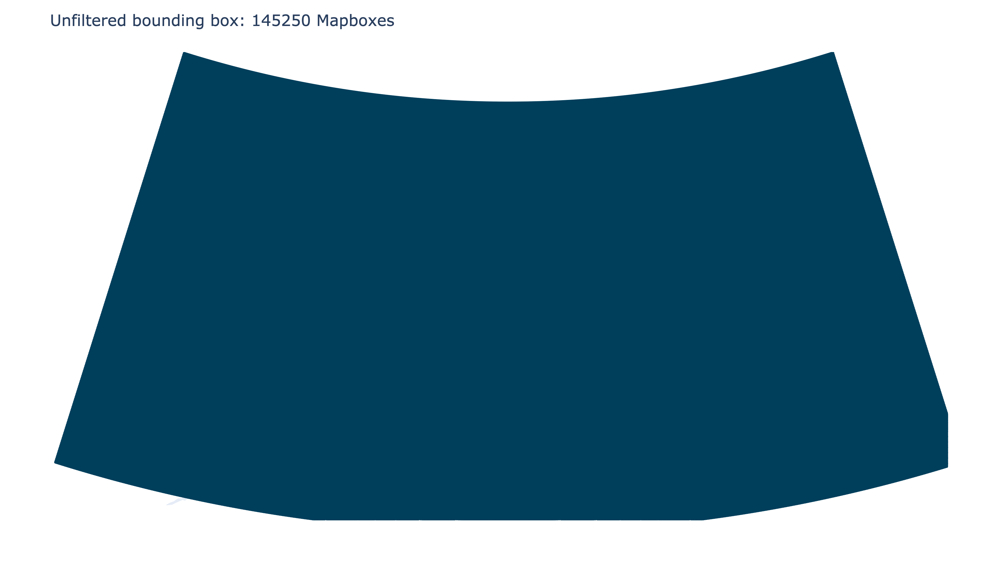

In [6]:
# Render .PNG image.
Image("1 - bounding box, unfiltered.png")

#### Nearest neighbor filtered mapboxes.

Can you see the United States now? There is a shape that _sort of_ looks like the continental US beginning to emerge. The nearest neighbor approach in `reverse_geocode` determines country based on relevant nearby cities and points of interest. This works fairly well on the Canadian and Mexican borders. But the approach fell down when dealing with international waters.

Let's see if I can find a more precise solution.

In [7]:
# Filter DataFrame.
filtered_mapbox_df = mapbox_df.copy()

# Create plot.
plot = px.scatter_geo(
    filtered_mapbox_df, 
    lat="lat", 
    lon="lng",
    color="in_us_nearest_neighbor",
    title='Filtered bounding box: {} Mapboxes'.format(len(filtered_mapbox_df[filtered_mapbox_df['in_us_nearest_neighbor']==True])),
    color_discrete_sequence=color_discrete_sequence
)

# Zoom into the US.
plot.update_layout(
    geo=dict(
        scope="usa",
    )
)

# Update title font size
plot.update_layout(
    title={
        'font': {
            'size': 30  # Title font size
        }
    }
)


# Save file locally.
plot.write_image("1 - bounding box, filtered.png", width=1920, height=1080, scale=2)

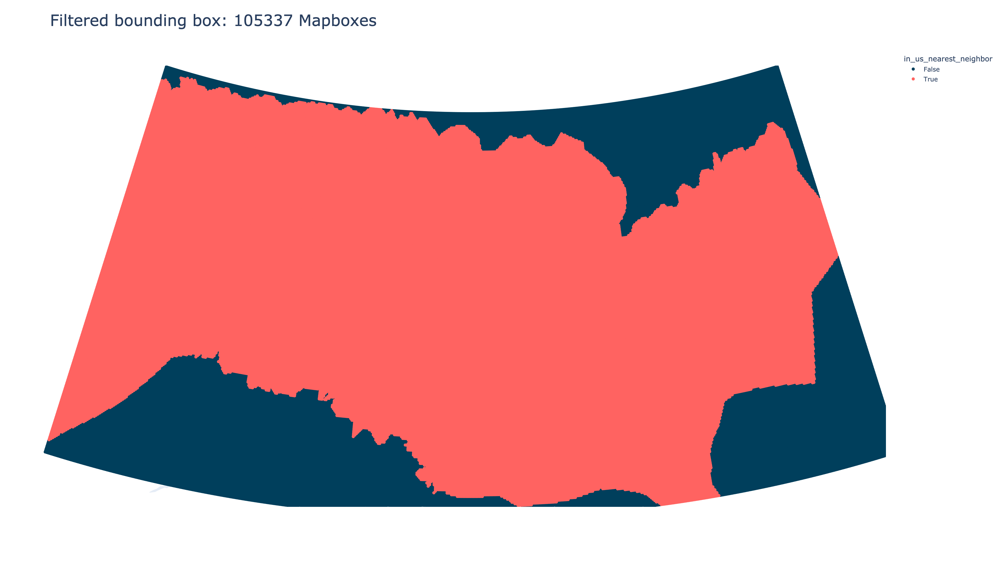

In [8]:
# Render .PNG image.
Image("1 - bounding box, filtered.png")

### 1.2 Filter Bounding Box with geopy

Since the fast method of nearest neighbors in `reverse_geocoder` didn't work, I am going to use `geopy`, which wraps around the geocoder `Nominatim`. Using this, I will be able to look up the country for a latitude / longitude point. This does fairly well with country-country borders, and considerably better in international waters than nearest neighbors.

`Nominatim`, as the core technology being used underneath `geopy`, is slower. I'm going to add a heuristic that help us move quickly in the middle of the country, because the borders and coasts are where we really need help filtering. The heuristics are going to bias toward false positives (labeling a point as United States that isn't) vs. false negatives (not labeling a point as United States that is), because the cost for a false positive is a few seconds of time (false negatives cost lost data that I'd prefer to collect for my project).

The function `geopy` will attempt to determine if a point is "United States", "Not United States (some other country)", or "International Waters". If it fails, it will return "Unclassified".

In [9]:
# Establish a geolocator agent.
geolocator = Nominatim(user_agent="mads2023_capstone_project")

In [10]:
"""
geopy_check

Leveraging the slower, but more precise, wrapper around Nominatim to
determine whether a lat/lng pair is in the United States, another country,
or somewhere in international waters.

    Args:
      lat: a latitude point.
      lng: a longitude point.
      raw: whether or not the location data is refined or raw.
    
    Returns:
      A determination of whether the coordinates are either 
      (1) in the US, (2) in another country, or (3) international waters.
 
For the purposes of filtering our lat/lng pairs, we will have raw=False as
the default case. Later in this project, we may benefit from being able to keep 
the raw geolocation data, so we'll give ourselves the option of flipping this to 
True and just getting back location.raw.
"""

def geopy_check(lat, lng, raw=False):
    
    # Preprocess lat/lng to a string format the geolocater can work with.
    search_string = f'''{lat}, {lng}'''

    # Make call via the geolocator.
    while True:
        try:
            location = geolocator.reverse(search_string)
            break
        # Exception? Wait 15 seconds.
        except (GeocoderTimedOut, GeocoderUnavailable, GeocoderServiceError):
            time.sleep(15)
            continue

    if raw==False:        
        # Conditionally determine how the location data should be categorized.
        # If there is no data, we assume international waters. If there is a country
        # that does not equal `United States`, we just say "Not United States" -
        # we don't care which country it is. Otherwise, return "United States".
        try:
            if location == None:
                return "International Waters"
            elif location.raw['address']['country'] != 'United States':
                return "Not United States"
            else:
                return "United States"
    
        # If something goes wrong, just return "Unclassified".
        except:
            return "Unclassified"

    # Used later in the scraper for more informative printing.
    if raw ==True:
        return location.raw

In [11]:
"""
geopy_review

A function that iterates through a DataFrame of lat/lng pairs to check
each one, and determine how it should be categorized based on `geopy_check`.
To cut down the runtime, a skip function is added to help go faster in the
middle of the United States (the borders are where we need it to slow down).

    Args:
      df: a pandas DataFrame, either mapbox_df or a subset of it.
      existing_data: defaults to True -- once the data is processed, this allows me to
      flip a switch and just import the already processed data (vs. reruning a
      long operation).
    
    Returns:
      Returns the original DataFrame, with a new column that stores the judgments
      made by geopy_check on whether or not each pair is (1) in the US, (2) in another country,
      or (3) in international waters. This will allow us to determine which locations should
      attempt to be scraped from Zillow, vs. which we should ignore.
"""

def geopy_review(df, existing_data=True):
    
    # The actual function.
    if existing_data == False:

        # Skip count. We'll use this for the skipping heuristic.
        skip_count = 0

        # Empty list to store the results.
        results = []

        # Track the last 10 results efficiently using a deque.
        last_10_results = collections.deque(maxlen=10)

        # Work through each record in df, tracking progress with tqdm.
        for i, row in tqdm(df.iterrows(), total=df.shape[0]):

            # If the last 10 results are all United States, just jump forward a few records and attribute
            # "United States" to the mapbox. This will lead to some errors, but cut down the runtime.
            if all(result == "United States" for result in last_10_results) and len(last_10_results) == 10 and skip_count < 10:
                skip_count += 1
                results.append("United States")
                last_10_results.append("United States")
                
            # If 10 records have been jump forwarded on, do a check on location with geopy. Or, if
            # any of the last_10_results are not "United States", slow down and check locations manually.
            else:
                skip_count = 0
                location = geopy_check(row['lat'], row['lng'])
                results.append(location)
                last_10_results.append(location)
       
        # Store results in a new column, `geopy_location`.
        df['geopy_location'] = results
        
        # Return the enriched DataFrame.
        return df
        
    # Read in processed data so someone can reproduce the whole notebook 
    # without waiting around on Nominatim to classify all of the data.
    elif existing_data == True:
        return pd.read_csv('mapboxes_dataframe.csv', index_col=False)

#### Let's do a quick test with 60 records...

In [12]:
# Randomly sample 60 records from seed 10.
mapbox_test = mapbox_df.sample(60, random_state=10)

# Run the function.
mapbox_test = geopy_review(df=mapbox_test, existing_data=False)

100%|██████████| 60/60 [00:37<00:00,  1.61it/s]


In [13]:
# Create plot.
plot = px.scatter_geo(mapbox_test, 
                      lat="lat", 
                      lon="lng", 
                      color='geopy_location',
                      title='Quick GeoPy Test: {} Mapboxes'.format(len(mapbox_test)),
                      color_discrete_sequence=color_discrete_sequence
                     )

# Zoom into the US.
plot.update_layout(
    geo=dict(
        scope="usa",
    )
)

# Update title font size
plot.update_layout(
    title={
        'font': {
            'size': 30  # Title font size
        }
    },
    legend={
        'font': {
            'size': 24  # Legend font size
        }
    }
)


# Save file locally.
plot.write_image("1 - bounding box, geopy (test).png", width=1920, height=1080, scale=2)

#### Test Success!

Overall, the algorithm did a fairly good job at identifying which points falls in which categories. This should be more effective than the nearest neighbors approach, and worth the extra runtime.

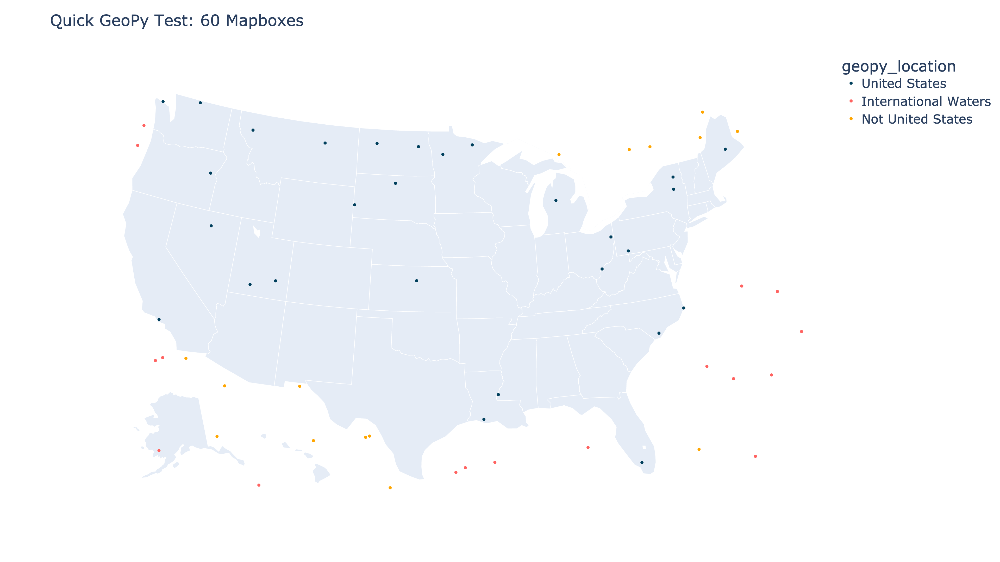

In [14]:
# Render .PNG image.
Image("1 - bounding box, geopy (test).png")

#### Now let's do it with all 145,250 mapboxes in the bounding box...

This originally took about 10 hours to run. But, by setting the arg `existing_data` to `True`, we can just fetch the results from the original run to make it easier for someone to reproduce this notebook.

In [15]:
# Existing data is set to true. It took about 9 hours to originally get this data from
# geopy. But now, someone can rerun this notebook to test out the flow using data that
# is stored in the file `1 - mapboxes_dataframe.csv` in the same directory as the
# Jupyter Notebook.
mapbox_df = geopy_review(df=mapbox_df, existing_data=True).drop('Unnamed: 0', axis=1)

# Verify the data came through correctly.
mapbox_df.head()

,lat,lng,in_us_nearest_neighbor,mapbox,geopy_location
0,24.446308,-124.95,False,"{""ne_lat"": ""24.496308000000003"", ""ne_lng"": ""-1...",United States
1,24.546308,-124.95,False,"{""ne_lat"": ""24.596308000000004"", ""ne_lng"": ""-1...",United States
2,24.646308,-124.95,False,"{""ne_lat"": ""24.696308000000005"", ""ne_lng"": ""-1...",United States
3,24.746308,-124.95,False,"{""ne_lat"": ""24.796308000000007"", ""ne_lng"": ""-1...",United States
4,24.846308,-124.95,False,"{""ne_lat"": ""24.89630800000001"", ""ne_lng"": ""-12...",United States


In [16]:
# Create plot.
plot = px.scatter_geo(mapbox_df, 
                      lat="lat", 
                      lon="lng", 
                      color='geopy_location',
                      title='GeoPy Full (skipmax=10): {} Mapboxes'.format(len(mapbox_df[mapbox_df['geopy_location']=='United States'])),
                      color_discrete_sequence=color_discrete_sequence
                     )

# Zoom into the US.
plot.update_layout(
    geo=dict(
        scope="usa",
    )
)

# Update title font size
plot.update_layout(
    title={
        'font': {
            'size': 30  # Title font size
        }
    },
    legend={
        'font': {
            'size': 24  # Legend font size
        }
    }
)


# Save file locally.
plot.write_image("1 - bounding box, geopy (full).png", width=1920, height=1080, scale=2)

#### That's much better.

We've filtered the total number of mapboxes down from 145,000~ to 89,000~ -- shaving off an additional 16,000~ over our nearest neighbor approach. Now we can see a bounding box that much more closely matches what we expect the shape of the United States to be.

Overall, we've removed about 40% of the mapboxes. For a job that will take a few weeks to run, this is a significant achievement in time savings!

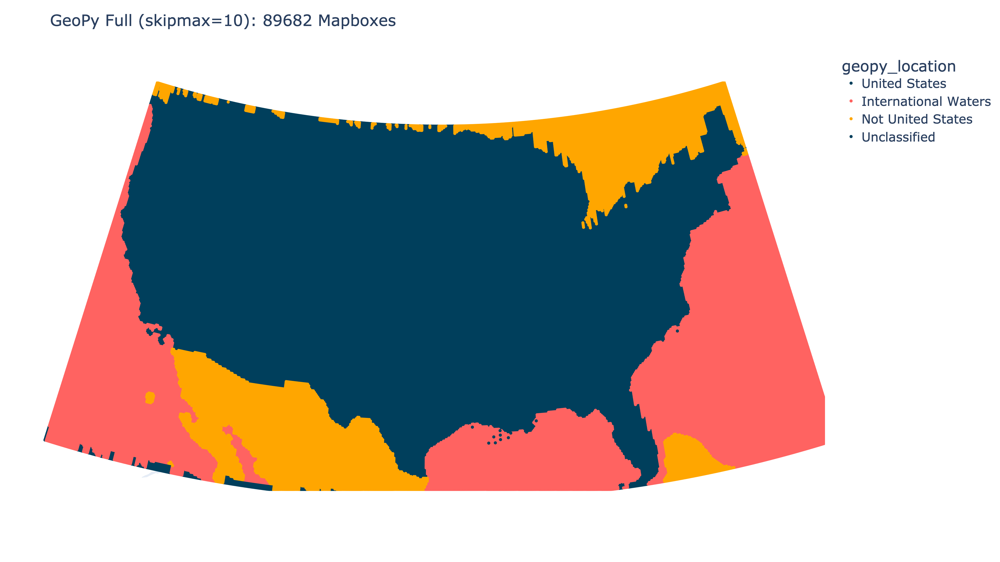

In [17]:
# Render .PNG image.
Image("1 - bounding box, geopy (full).png")

I also saw minimal entries (.01%~) end up in an "Unclassified" state. This gives me confidence that I can go ahead and just grab the points labeled United States, and move forward.

There are some smudges on the map as an artifact of the skipping heuristic. It's not worth trying to cut that out for an additional 1-2% of reduction in mapboxes. Once we scrape the data, we'll be able to drop listings in Canada and Mexico fairly easily by looking at the listing metadata we scrape.

In [18]:
# See mapbox labels by grouping.
mapbox_df.groupby('geopy_location').size()

geopy_location
International Waters    36334
Not United States       19223
Unclassified               11
United States           89682
dtype: int64

### 1.3 Generate search page URLs

I've filtered the mapbox to a manageable size. I'll now use the mapbox data to create Zillow search URLs. These will be my jumping off points into Zillow's search results where I'll find URLs to individual listings.

First, I'll created `us_mapbox_filter`, with only the mapboxes we want to look at. 

In [19]:
# Filter for only the relevant records
us_mapboxes_df = mapbox_df.copy()
us_mapboxes_df = us_mapboxes_df[us_mapboxes_df['geopy_location'] == 'United States']

# Quick check: are we seeing only the 89,000~ records we expect to see?
print('US Mapboxes: {}'.format(len(us_mapboxes_df)))

US Mapboxes: 89682


Then I'll create a helper function that can be used to pull the mapbox coordinates out of each row of `us_mapboxes_df`.

In [20]:
"""
unpack_mapbox

Take a json.dump'ed representation of a mapbox, json.load's it, and then
store the points of the mapbox as four distinct attributes. This prepares
the mapbox data to be used by the web scraper.

    Args:
      row: a pandas Series, expected to come from df.iterrows().
      method: If, for some reason, this function is used later in the
      script by something that is not a row pandas Series, we can switch this
      from its default ('row') to 'mapbox', which is just a saying that the 
      json.dump'ed mapbox is being accessed as an individual variable.
    
    Returns:
      The 4 corners of the mapbox required to build the Zillow url.
"""

def unpack_mapbox(row, method='row'):
    if method=='row':
        mapbox = json.loads(row['mapbox'])
    elif method=='mapbox':
        mapbox = json.loads(row)
    # Unpack the values.
    sw_lng = mapbox['sw_lng']
    ne_lng = mapbox['ne_lng']
    sw_lat = mapbox['sw_lat']
    ne_lat = mapbox['ne_lat']
    # return values
    return sw_lng, ne_lng, sw_lat, ne_lat

After that, I'll create a function that can take those mapbox coordinates and create our URLs for Zillow search result pages.

In [21]:
"""
url_generator

Creates the search page URLs required as a jumping off point
for this web scraper to work.

    Args:
      sw_lng: The west edge of the mapbox.
      ne_lng: THe east edge of the mapbox.
      sw_lat: The south edge of the mapbox.
      ne_lat: The north edge of the mapbox.
    
    Returns:
      Mapboxed URL of Zillow search page - we will use this to find 
      listings, jump into their listing page, and scrape data.
"""

def url_generator(sw_lng, ne_lng, sw_lat, ne_lat):
    url = ''.join([
                    'https://www.zillow.com/homes/for_sale/?searchQueryState=',
                    '{"pagination":{"currentPage":1},"isMapVisible":false,',
                    '"mapBounds":{"west":' + sw_lng + ',"east":' + ne_lng + ',"south":' + sw_lat + ',"north":' + ne_lat + '},'
                    '"mapZoom":14,"filterState":{},"isListVisible":true}'
                ])
    return url

Let's generate the search results URLs from the data stored in `us_mapboxes`.

In [22]:
# Empty results list.
urls = []

# For each mapbox in the now filtered list of mapboxes.
for i, row in tqdm(us_mapboxes_df.iterrows(), total=us_mapboxes_df.shape[0]):
    # Access the JSON datastructure stored in the column mapbox.
    sw_lng, ne_lng, sw_lat, ne_lat = unpack_mapbox(row)
    # Generate a URL, and append it.
    urls.append(url_generator(sw_lng, ne_lng, sw_lat, ne_lat))

# Save the values as a new column.
us_mapboxes_df['search_url'] = urls

100%|██████████| 89682/89682 [00:02<00:00, 43686.00it/s]


#### Let's pop open an iframe and take a quick look at one of the URLs!

Success: a URL from near the top of the list gives us a Zillow search result page for a location that seems to be in Oregon.

In [23]:
%%html
<iframe src='https://www.zillow.com/homes/for_sale/?searchQueryState={"pagination":{},"isMapVisible":false,"mapBounds":{"west":-123.60000000000008,"east":-123.50000000000009,"south":46.096308000000306,"north":46.19630800000031},"mapZoom":14,"filterState":{},"isListVisible":true}' width="1200" height="1000"></iframe>

# 2. Scrape page

Now that I have all of the URLs I need, it's time to build the web scraper!

Generally speaking, the scraper will work like this:

<div class="alert alert-info">
<li>We have a series of filtered mapbox Zillow search results URLs (built in prior section of this Notebook).</li>
<li>We open each link to the search page.</li>
<li>We collect the links to each of the Zillow listings referenced on the page, working our way through the pagination until we have all of the listings.</li>
<li>We then open each listing one at a time.</li>
<li>We collect the information we want to scrape into a JSON data structure.</li>
<li>We save this information in a CSV format with a single record for each Zillow listing.</li>
</div>

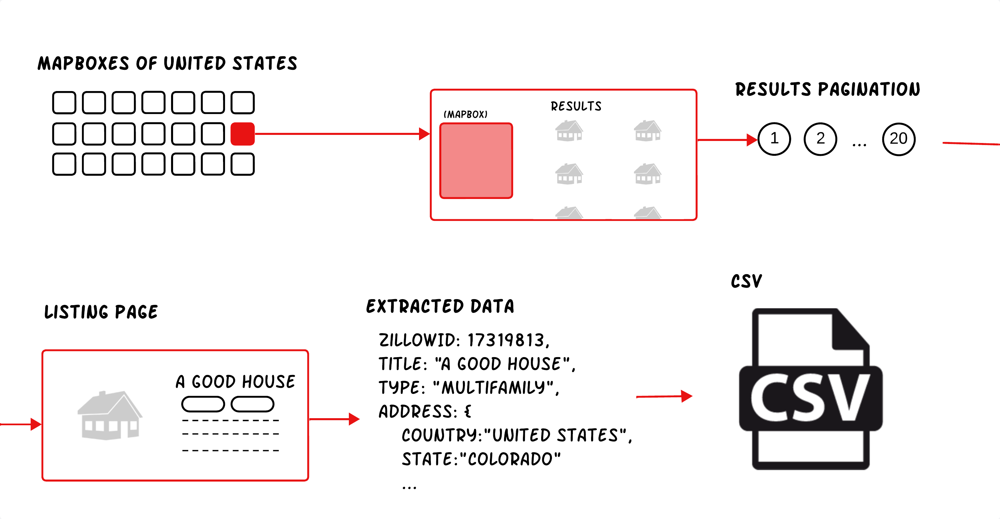

### Featured functionality: handling large cities.

A unique feature of this webscraper is its ability to handle large cities. The 19 square mile mapboxes will work with most of the United States. But in cities, I will encounter search results pages that hit the 500 listing limit that Zillow enforces.

To handle that, I use a recursive function to:

<div class="alert alert-info">
<li>Detect if Zillow is limiting the results <i>(it will look like the search page saying there are exactly 500 results)</i>.</li>
<li>Break apart the mapbox into 4 equally sized smaller boxes.</li>
<li>Check to see if all of the boxes have less than 500 results.</li>
<li>If any of the mapboxes fail that check, break _those_ mapboxes into 4 equally sized smaller boxes.</li>
<li>Once all boxes pass the test, scrape all of those smaller mapboxes and concatenate those results.</li>
</div>
    
This will slow down the scraper when it goes over cities. But this functionality will help us to get way more listings out of cities, which will be helpful for understanding the density of listings across the US.

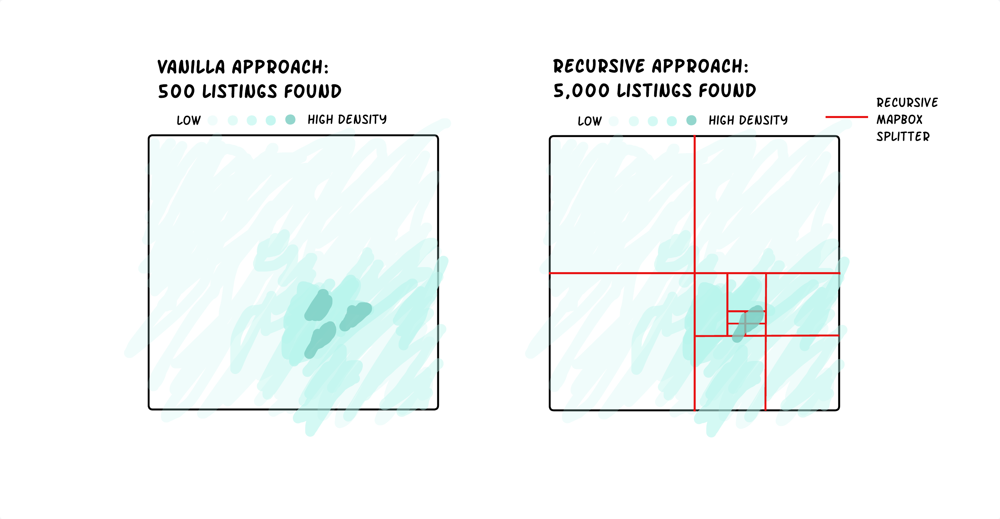

### A few guiding principles

A couple of simple maxims to help guide the build:

<div class="alert alert-info">
<li><b>Be a thoughtful scraper</b>: Zillow, as the owner of Zillow.com, has every right to block my traffic if I become annoying to them. How do I avoid getting blocked? <i>Act human</i>. I have my scraper mimic as if it is coming from a web browser (like Chrome), just like a human would do. I pause, and wait a few seconds, between calls to Zillow. I make sure these breaks are random, sporadic, and don't follow a rigid pattern. In other words, I slow my scraper down so that it looks like someone clicking through a bunch of Zillow listings; going faster than a human risks the scraper getting blocked to prevent what could look like a denial of service attack from Zillow's perspective. This information is all publicly available on listing pages -- but no one should accept a webscraper trying to call thousands of webpages a minute <i>(The information in Zillow's `robot.txt` file provides some helpful guidelines to reduce the guesswork here)</i>.</li>
 
<li><b>The goal is not to collect every listing on Zillow</b>: It benefits me to collect a lot of listings, because a big dataset will help build a better algorithm (all other things constant). But, I won't spend a lot of time going down rabbit holes for marginal improvements. I should easily be able to get 100,000 - 200,000+ listings with my current approach. That's enough for the goal I want to accomplish.</li>
</div>

### 2.1 Define headers

The headers help make my request to fetch a page look human. It specifies I am coming from a Mac, using Chrome, with other elements that real people would have accessing these pages from their browser. I'll use these when making my calls to Zillow.

In [24]:
# Headers for a more human looking request when web scraping.
headers = {
    'accept': '*/*',
    'accept-encoding': 'gzip, deflate, br',
    'accept-language': 'en-US,en;q=0.9',
    'cookie': 'OptanonAlertBoxClosed=NR; OptanonAlertBoxClosed=NR; bev=1671467614_NDg3YWI1OWViODE0; country=UK; everest_cookie=1671467934.o8UVAqq76D3QPRXxo5SV.2TXJ26qIr6wRp2aGPSqpNu0hmcaL7JhFzmDBWbnzmDw; _csrf_token=V4%24.airbnb.com%24Dwa4m1DnRds%24l_ThNsfxVtYzJnV3gf7vehcjPJusOG_QBcYxaP2lZOM%3D; flags=0; _gcl_au=1.1.1979572412.1671467936; _ga=GA1.1.923589191.1671467936; tzo=-420; frmfctr=wide; ak_bmsc=2BF62A04339B5A8040F6BE42D7397A3E~000000000000000000000000000000~YAAQjuXEF4UQhgeFAQAA27JjLRJCqxbQs87wSwEdHRYX0G6/TDKZTovu4o6yCZ81IqZ6MhWckkFsgOG1eRvCyGcwYcGwZT6Hj0lKPA7+LECJW/p7uLVBPkdj9vDMc+M3APPxtp3dA4N7Xiz9k2CsK1cScWB15o99WkNT8TblkPRJMP+//tibMWG2xoEjeEV14znNbpxu/a19eOVXAFS6pvZFEKc1PvKaN6qVTNMeaHczy8vtIlUIhOHm8n0/neIB5WjhQewZ2bsI4Jk5FAyuugtHiXFiRJU7poWmTC1z3vQV5BNZly4umCoBfxL+4/1Gwtvg+5jzWIgEsQIOlNvhj6IhTWNdgIiUubyhm6SwXUHdD2r80FCzSqqkgs/F95M/C2eTuiMmpV414Qo=; jitney_client_session_id=d94ad55f-160c-4b75-aa19-6b94073c92fc; jitney_client_session_created_at=1671505980; _user_attributes=%7B%22curr%22%3A%22USD%22%2C%22guest_exchange%22%3A1.0%2C%22device_profiling_session_id%22%3A%221671467934--953d4ec0c3e885ffcfcecdcb%22%2C%22giftcard_profiling_session_id%22%3A%221671503786--bedf36f5fd7bc1727463feba%22%2C%22reservation_profiling_session_id%22%3A%221671503786--104feb525ef2701da84b3359%22%7D; jitney_client_session_updated_at=1671505982; _ga_2P6Q8PGG16=GS1.1.1671505983.4.1.1671505983.0.0.0; _uetsid=a14c3a907fbb11ed80888db3ffb5b814; _uetvid=a14c54c07fbb11edbfa35d16156e96a6; previousTab=%7B%22id%22%3A%22c5e39694-2720-411d-bbb4-5880ad1455b6%22%2C%22url%22%3A%22https%3A%2F%2Fwww.airbnb.com%2Fs%2FUnited-States%2Fhomes%22%7D; bm_sv=67E8D97D583DC2BA73262B2A33B8BD6A~YAAQjuXEF3gehweFAQAAzlqFLRKkxd6iaP1xq0hHbfO3CsyIIQifNN1kg5O8tYdobGiFUFkAU0ek5Tg67B28nu2btfk+1yHhT6TE1jibTRrmUjxmCnS6gZ9Sclthu91yIEEePEd32A66YE2G6ofZjSQCTS8TsZU9O8pKFQ7Nid5vVQ6DlyEPLX5yEYMLK94A1kBNulzVg+KjaWf2UN8pSkr66hIUxNn5Qq3fQtl8kCxJeSb6MGW977OC++DGDRXKqg==~1; cfrmfctr=MOBILE; cbkp=2',
    'device-memory': '8',
    'dpr': '2',
    'ect': '4g',
    'sec-ch-ua': '"Not?A_Brand";v="8", "Chromium";v="108", "Google Chrome";v="108"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"macOS"',
    'sec-fetch-dest': 'empty',
    'sec-fetch-mode': 'no-cors',
    'sec-fetch-site': 'same-origin',
    'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/108.0.0.0 Safari/537.36',
    'viewport-width': '895'
    }



### 2.2 Define BeautifulSoup scraper

I'll use `BeautifulSoup` to create a webscraping function, `getsoup`. This will take in a url, my already defined headers, and make 5 attempts to get the html of the page. If there are any exceptions, it will print the Exception, and try again N seconds later (N=some random integer between 7 and 15).

If it fails 5 times in a row, it will return an empty `None` object.

In [25]:
"""
get_soup

My basic building block of requesting the HTML of a page living at a given URL,
and then turning that into a BeautifulSoup object.

    Args:
      url: the url of the page to scrape.
      headers: the headers for the request (helps the request look less suspicious).
    
    Returns:
      bs4 BeautifulSoup text representation of the page (or, None if fails 5 times in a row).
"""

def get_soup(url, headers=headers):

    # Make 5 attempts to get the page.
    for i in range(5):
        try:
            session = requests.Session()
            session.headers.update(headers)
            response = session.get(url)
            soup = BeautifulSoup(response.text, 'html.parser')
            return soup
        except Exception as e:
            #print('get_soup:', e)
            time.sleep(random.randint(7,15)) # Wait a few seconds before trying again.
            pass
            
    # If nothing returned, let it pass.
    return None

In [26]:
soup = get_soup(url='https://www.zillow.com/homedetails/37-McClelland-St-Saranac-Lake-NY-12983/30445264_zpid/')

### 2.3 Define listing page scraper

Now let's build our listing scraper, `scrape_listing_page`. This function, with some assistance from `fetch_script_data`, will pull together a structured DataFrame with a wide range of data about the building, the financial history, the nearby schools, and the surrounding area.

In [28]:
"""
fetch_script_data

Helps us quickly isolate the section of the soup object where we 
will want to scrape data.

    Args:
      A bs4 BeautifulSoup text represenation of a listing page.
    
    Returns:
      A specific subsection of the webpage where a lot of valuable metadata
      lives. This is a helper function for `scrape_listing_page`.
"""

def fetch_script_data(soup):
    # JSON data hiding in script format in HTML.
    script_id= "__NEXT_DATA__"
    dictionary = json.loads(json.loads(soup.find('script', {'id':script_id}).string)['props']['pageProps']['componentProps']['gdpClientCache'])
    
    # The values we want to access are in the key at the 0th index -- but the key name changes based on the
    # listing. As opposed to trying to recreate the key, we're just going to tell the script to "get the values
    # at the 0th index key.
    _, dictionary_values = next(iter(dictionary.items()))
    
    # Fetch the property data.
    script_data = dictionary_values['property']

    # Return it as the variable script_data.
    return script_data

The function `scrape_listing_page` is long, but it is fairly straightforward. For each of the 50+ features, I attempt to scrape it. If it fails, I return a None value. There are likely some efficiencies that could be done to make this code more terse and truncated. But, since it doesn't really have an impact on performance, I'll keep it as is for now.

In [29]:
"""
scrape_listing_page

Create a 50+ column single row DataFrame with data from the listing. Some features we expect to fail
on certain listings (example: an undeveloped lot of land won't have any bedrooms). If it fails, just
write a None record so that it doesn't blow up the job.

    Args:
      A bs4 BeautifulSoup text represenation of a listing page.
    
    Returns:
      A single row pandas DataFrame with all of the data from that listing extracted into a structured format.
"""

def scrape_listing_page(soup):
    
    # Dictionary with scraped values.
    scrape = {}

    try:
         # Fetch JSON structured data hiding in HTML of the page.
        script_data = fetch_script_data(soup)
    except:
        return None

    try:
        # Step into the listing facts subsection.
        listing_facts = script_data['resoFacts']
    except:
        return None

    try:
        # Zillow ID.
        scrape['zillowId'] = script_data['zpid']
    except:
        scrape['zillowId'] = None

    # Home Status.
    try:
        scrape['homeStatus'] = script_data['homeStatus']
    except:
        scrape['homeStatus'] = None

    # Address
    try:
        scrape['streetAdress'] = script_data['address']['streetAddress']
    except:
        scrape['streetAdress'] = None

    try:
        scrape['city'] = script_data['address']['city']
    except:
        scrape['city'] = None

    try:
        scrape['state'] = script_data['address']['state']
    except:
        scrape['state'] = None

    try:
        scrape['zipcode'] = script_data['address']['zipcode']
    except:
        scrape['zipcode'] = None
    
    # Price
    try:
        scrape['price'] = script_data['price']
    except:
        scrape['price'] = None
    
    # Bedrooms.
    try:
        scrape['bedrooms'] = script_data['bedrooms']
    except:
        scrape['bedrooms'] = None
    
    # Bathrooms.
    try:
        scrape['bathrooms'] = script_data['bathrooms']
    except:
        scrape['bathrooms'] = None

    # Year built.
    try:
        scrape['yearBuilt'] = script_data['yearBuilt']
    except:
        scrape['yearBuilt'] = None
    
    # Zestimate.
    try:
        scrape['zestimate'] = script_data['zestimate']
    except:
        scrape['zestimate'] = None

    # House type.
    try:
        scrape['homeType'] = listing_facts['homeType']
    except:
        scrape['homeType'] = None

    # Price per square foot.
    try:
        scrape['pricePerSquareFoot'] = listing_facts['pricePerSquareFoot']
    except:
        scrape['pricePerSquareFoot'] = None

    # Square feet.
    try:
        scrape['livingArea'] = listing_facts['livingArea']
    except:
        scrape['livingArea'] = None

    # Basement.
    try:
        scrape['basementYN'] = listing_facts['basementYN']
    except:
        scrape['basementYN'] = None

     # Garage.
    try:
        scrape['hasGarage'] = listing_facts['hasGarage']
    except:
        scrape['hasGarage'] = None

    # Parking capacity.
    try:
        scrape['parkingCapacity'] = listing_facts['parkingCapacity']
    except:
        scrape['parkingCapacity'] = None

    # listingTerms - basically what kind of financing is an option.
    try:
        scrape['listingTerms'] = listing_facts['listingTerms']
    except:
        scrape['listingTerms'] = None

    # What kind of schools are in the area.
    try:
        scrape['schools'] = json.dumps(script_data['schools'])
    except:
        scrape['schools'] = None

    # Sewer
    try:
        scrape['sewer'] = json.dumps([i for i in listing_facts['sewer']])
    except:
        scrape['sewer'] = None

    # patioAndPorchFeatures.
    try:
        scrape['patioAndPorchFeatures'] = json.dumps([i for i in listing_facts['patioAndPorchFeatures']])
    except:
        scrape['patioAndPorchFeatures'] = None

    # hasHeating
    try:
        scrape['hasHeating'] = listing_facts['hasHeating']
    except:
        scrape['hasHeating'] = None

    # Fireplace
    try:
        scrape['fireplaces'] = listing_facts['fireplaces']
    except:
        scrape['fireplaces'] = None

    # Waterfront view.
    try:
        scrape['hasWaterfrontView'] = listing_facts['hasWaterfrontView']
    except:
        scrape['hasWaterfrontView'] = None        

    # Senior community
    try:
        scrape['isSeniorCommunity'] = listing_facts['isSeniorCommunity']
    except:
        scrape['isSeniorCommunity'] = None

    # levels
    try:
        scrape['levels'] = listing_facts['levels']
    except:
        scrape['levels'] = None
    
     # Square feet, lot.
    try:
        scrape['lotSize'] = listing_facts['lotSize']
    except:
        scrape['lotSize'] = None

    # HOA.
    try:
        scrape['hoaFee'] = listing_facts['hoaFee']
    except:
        scrape['hoaFee'] = None

    # Buyers fee percent.
    try:
        scrape['buyersFeePerc'] = listing_facts['atAGlanceFacts'][8]['factValue']
    except:
        scrape['buyersFeePerc'] = None

    # Days on Zillow.
    try:
        scrape['daysOnZillow'] = script_data['daysOnZillow']
    except:
        scrape['daysOnZillow'] = None

    # Views.
    try:
        scrape['views'] = script_data['pageViewCount']
    except:
        scrape['views'] = None

    # Favorites.
    try:
        scrape['favorites'] = script_data['favoriteCount']
    except:
        scrape['favorites'] = None

    # Latitude. 
    try:
        scrape['latitude'] = script_data['latitude']
    except:
        scrape['latitude'] = None
        
    # Longitude.
    try:
        scrape['longitude'] = script_data['longitude']
    except:
        scrape['longitude'] = None
    
    # Main photo.
    try:
        scrape['mainPhoto'] = script_data['desktopWebHdpImageLink']
    except:
        scrape['mainPhoto'] = None

    # Brokerage
    try:
        scrape['brokerage'] = script_data['brokerageName']
    except:
        scrape['brokerage'] = None

    # Percent of homes this home is selling faster than.
    try:
        scrape['percSellFaster'] = script_data['sellingSoon'][0]['percentile']
    except:
        scrape['percSellFaster'] = None

    # Property tax.
    try:
        scrape['propertyTax'] = script_data['propertyTaxRate']
    except:
        scrape['propertyTax'] = None

    # Mortgage Rate.
    try:
        scrape['mortgageRate'] = script_data['mortgageZHLRates']['thirtyYearFixedBucket']['rate']
    except:
        scrape['mortgageRate'] = None
        
    # Listing user's User ID.
    try:
        scrape['listingUserId'] = script_data['listingAccountUserId']
    except:
        scrape['listingUserId'] = None
        
    # Agent Name
    try:
        scrape['agentName'] = script_data['contactFormRenderData']['data']['agent_module']['display_name']
    except:
        scrape['agentName'] = None
    
    # Agent Rating
    try:
        scrape['agentRating'] = script_data['contactFormRenderData']['data']['contact_recipients'][0]['rating_average']
    except:
        scrape['agentRating'] = None
    
    # Agent Recent Sales
    try:
        scrape['agentRecentSales'] = script_data['contactFormRenderData']['data']['contact_recipients'][0]['recent_sales']
    except:
        scrape['agentRecentSales'] = None
    
    # Agent # of Reviews
    try:
        scrape['agentReviewsCount'] = script_data['contactFormRenderData']['data']['contact_recipients'][0]['review_count']
    except:
        scrape['agentReviewsCount'] = None
    
    # Listing photos
    try:
        scrape['photosList'] = json.dumps([i['url'] for i in script_data['responsivePhotos']])
    except:
        scrape['photosList'] = None
    
    # Is it a foreclosure?
    try:
        scrape['isForeclosure'] = script_data['listingSubType']['isForeclosure']
    except:
        scrape['isForeclosure'] = None
    
    # Is it for sale by owner?
    try:
        scrape['isFSBO'] = script_data['listingSubType']['isFSBO']
    except:
        scrape['isFSBO'] = None
    
    # Is it bank owned?
    try:
        scrape['isBankOwned'] = script_data['listingSubType']['isBankOwned']
    except:
        scrape['isBankOwned'] = None
    
    # Is it Zillow owned?
    try:
        scrape['isZillowOwned'] = script_data['isZillowOwned']
    except:
        scrape['isZillowOwned'] = None
    
    # Rent estimate
    try:
        scrape['rentZestimate'] = script_data['rentZestimate']
    except:
        scrape['rentZestimate'] = None
    
    # Rent actual
    try:
        scrape['totalActualRent'] = listing_facts['totalActualRent']
    except:
        scrape['totalActualRent'] = None
    
    # Annual house insurance cost
    try:
        scrape['annual_house_insurance'] = script_data['annualHomeownersInsurance']
    except:
        scrape['annual_house_insurance'] = None
    
    # Price history
    try:
        scrape['price_history'] = json.dumps([(event['date'], event['price']) for event in script_data['priceHistory']])
    except:
        scrape['price_history'] = None
    
    # Description
    try:
        scrape['description'] = script_data['description']
    except:
        scrape['description'] = None
    
    # Pool
    try:
        scrape['hasPrivatePool'] = script_data['hasPrivatePool']
    except:
        scrape['hasPrivatePool'] = None
    
    # Attic
    try:
        scrape['attic'] = script_data['attic']
    except:
        scrape['attic'] = None
    
    # Similar homes
    try:
        scrape['similarHomes'] = json.dumps([home['zpid'] for home in script_data['collections']['modules'][0]['propertyDetails']])
    except:
        scrape['similarHomes'] = None

    return pd.DataFrame(scrape, index=[0])
    

### 2.4 Define helping functions for helping the scraper navigate.

With the listing and search results page scrapers built, the majority of the code is written. What I now need is the ability to move fluidly between different links that I need to scrape. This is what will allow me to click a button, walk away, and let this job run.

I'll first set up a series of helper functions that will allow me to achieve a series of subtasks required to allow this scraper to navigate between the mapboxes.

In [30]:
"""
no_matching_results_check

Sometimes, there are no results in a mapbox. If that is true, we want to figure that out as 
quickly as possible so we don't waste any time trying to scrape listings off the page.

    Args:
      soup: a BeautifulSoup representation of a webpage (assumed a Zillow search result page).
    
    Returns:
      If "no matching results" is found as a string in the webpage, return True (there are no matching
      results). If not, return False.
"""


def no_matching_results_check(soup):
    # Search for the string "no matching results", which shows up on pages with no listings.
    noMatchingResults = soup.find(string=re.compile("no matching results", re.IGNORECASE))

    # If "no matching results" was found:
    if noMatchingResults:
        return True

    # Otherwise, return False:
    else:
        return False

In [31]:
"""
has_next_page

It's very common for a search results page to have more than one page of results. I want to detect if
pagination is occurring, and if yes, proceed to the next page of listings.

    Args:
      soup: a BeautifulSoup representation of a webpage (assumed a Zillow search result page).
    
    Returns:
      We search for the "next" button on search. If we can't find it, or if it is disabled (no more paginated results),
      return False (there are no more pages). Otherwise, treturn True (there is at least one more page of results 
      after the current one).
"""

def has_next_page(soup):

    # See if you can find the 'next' button on the paginated results.
    try:
        nextButtonClass = 'PaginationJumpItem-c11n-8-84-3__sc-18wdg2l-0 jRUCrX'
        nextButtonDisabled = soup.find_all('li', {'class': nextButtonClass})[1].find('a').get('aria-disabled')

        # If the button is not disabled, there is at least one more page.
        if nextButtonDisabled == 'false':
            return True

        # If it is disabled, there are no more pages.
        elif nextButtonDisabled == 'true':
            return False

    # If there is only one page of results, these buttons won't be there. If it fails, assume only one page of listings.
    except Exception as e:
        return False

In [32]:
"""
uptick_pagination

If I detect there is another page of results, I need a way to transform my url for the current page of results
I am on to become the next page. This function handles upticking the pagination in the data structure of the url.

    Args:
      url: the url of the Zillow search page we are currently on.
    
    Returns:
      modified_url: the url, but with its pagination upticked one page (this flips us to the next page of 
      results in the mapbox).

"""

def uptick_pagination(url):
    
    # Parse the URL
    parsed_url = urlparse(url)
    
    # Parse the query parameters
    query_params = parse_qs(parsed_url.query)
    
    # Check if the query parameters include 'searchQueryState'
    if 'searchQueryState' in query_params:
        
        # Parse the JSON data in 'searchQueryState'
        search_query_state = json.loads(query_params['searchQueryState'][0])
        
        # Check if 'pagination' is present in 'searchQueryState'
        if 'pagination' in search_query_state:
            
            # Increment the 'currentPage' value
            search_query_state['pagination']['currentPage'] += 1
            
            # Update the 'searchQueryState' in query parameters
            query_params['searchQueryState'][0] = json.dumps(search_query_state)
    
    # Reconstruct the modified URL
    modified_url = urlunparse((parsed_url.scheme, parsed_url.netloc, parsed_url.path,
                               parsed_url.params, urlencode(query_params, doseq=True),
                               parsed_url.fragment))

    # Return new, modified url.
    return modified_url

In [33]:
"""
is_already_scraped

There could be any number of reasons the scraper gets interrupted. I want it to be able to not waste time 
as the job re-runs. This function will check to see if a Zillow listing has already been scraped before 
attempting to scrape it again.

    Args:
      zillowId: the ID of the listing we are about to scrape.
      existing_data: the DataFrame that stores all of the listings we have already scraped.
    
    Returns:
      If we already have data for a listing that matches this zillowId, return True. If not, return False.
"""

def is_already_scraped(zillowId, existing_data):

    # Try to create a list of already scraped listings' Zillow IDs.
    try:
        already_scraped = [int(id) for id in existing_data['zillowId']]

    # If it fails, print an error - but proceed with a dummy value to stop the job
    # from breaking. Considering the job will often be unattended, it is more efficient
    # to let it continue then to let it break for 12-18 hours.
    except:
        print('Error: no existing data found.')
        already_scraped = [1]

    # If zillowId is already scraped, return True.
    if int(zillowId) in already_scraped:
        return True

    # Else, return False.
    else:
        return False

In [34]:
"""
fetch_listings_from_search

Once I have a BeautifulSoup representation of a Zillow search page, this allows me to quickly extract all of the
URLs for Zillow listings on the page. This function allows me to jump from the search results page into a list of
listing pages from which I can scrape data.

    Args:
      soup: a BeautifulSoup representation of a webpage (assumed a Zillow search result page).
      existing_data: the DataFrame that stores all of the listings we have already scraped.
    
    Returns
      urls: a list of urls to Zillow listings to scrape.

existing_data isn't directly used by this function, but is passed through to where it calls is_already_scraped
to determine which Zillow listing URLs should be scraped.
"""

def fetch_listings_from_search(soup, existing_data):

    # Try to fetch the listings form the search page.
    try:
        script_id = "__NEXT_DATA__"
        pageResults = json.loads(soup.find('script', {'id':script_id}).string)['props']['pageProps']['searchPageState']['cat1']['searchResults']['listResults']
       
        # Get the URLs for the listings, filtering out listings we already have in the DataFrame existing_data.
        urls = [result['detailUrl'] for result in pageResults if is_already_scraped(result['zpid'], existing_data) == False]
        return urls

    # No listings found? Return an empty list.
    except Exception as e:
        return []

In [35]:
"""
zoom_in_mapbox

This takes an existing mapbox, and breaks it apart into four separate mapboxes of equal sizes.

    Args:
      mapbox: a json dump'ed representation of a mapbox.
    
    Returns:
      sub_urls: A list of four URLs that point to Zillow search results for each of the separate mapboxes.
"""

def zoom_in_mapbox(mapbox):
    # unpack mapbox.
    sw_lng, ne_lng, sw_lat, ne_lat = unpack_mapbox(mapbox, method='mapbox')

    # mid point longitude and mid point latitude.
    mid_lng = str((float(sw_lng) + float(ne_lng)) / 2)
    mid_lat = str((float(sw_lat) + float(ne_lat)) / 2)

    # Create the 4 submapboxes.
    sub_mapboxes = [
        (sw_lng, mid_lng, mid_lat, ne_lat),
        (mid_lng, ne_lng, mid_lat, ne_lat),
        (sw_lng, mid_lng, sw_lat, mid_lat),
        (mid_lng, ne_lng, sw_lat, mid_lat)
    ]

    # Generate list of URLs.
    sub_urls = [                                         
        url_generator(
            sw_lng=box[0], ne_lng=box[1], 
            sw_lat=box[2], ne_lat=box[3]) 
        for box in sub_mapboxes]

    # Return a list of URLs.
    return sub_urls

In [36]:
"""
too_many_results_check

This is our check to see if the results page has too many results to expect all of them to be available to scrape.
As a heuristic, we'll use 500 listings as the cut off point.

    Args:
      soup: a BeautifulSoup representation of a webpage (assumed a Zillow search result page).
    
    Returns:
      True if there are 500 or more listings in this search results, False if not.
"""

def too_many_results_check(soup):

    # Attempt to see how many results are on the page.
    try:
        script_id = "__NEXT_DATA__"
        pageResults = int(json.loads(soup.find('script', {'id':script_id}).string)['props']['pageProps']['searchPageState']['categoryTotals']['cat1']['totalResultCount'])
        
        # If there are 500 or more results, return True.
        if pageResults >= 500:
            return True

        # Else, return False.
        else:
            return False

    # If an exception occurs, assume there are not too many results on the page.
    except Exception as e:
        return False

In [37]:
"""
scrape_search_page

When given a search results page, this function paginates through all pages and returns a list of
URLs for the Zillow listings to be scraped.

    Args:
      url: the url of the Zillow search page we are currently on.
      existing_data: the DataFrame that stores all of the listings we have already scraped.
    
    Returns:
      A list of URLs, `unique_urls`, that represent all of the listings that could be found on the paginated
      set of search result pages.
"""


def scrape_search_page(url, existing_data):

    # Get search page BeautifulSoup HTML.
    soup = get_soup(url)

    # Sleep awhile.
    time.sleep(random.randint(3,7))

    # If no results were found, exit.
    noMatchingResults = no_matching_results_check(soup)
    if noMatchingResults == True:
        return 'Alert: no results'

    # If too many results were found, exit:
    tooManyResults = too_many_results_check(soup)
    if tooManyResults == True:
        return 'Alert: too many results'

    # Create an empty set of urls.
    unique_urls = set()
    
    # A counter used to protect against accidental infinity loops.
    count = 0
    
    while True:
        urls = fetch_listings_from_search(soup, existing_data)
        unique_urls.update(urls)

        # Zillow never has more than 20 pages. If we pass that number, something is wrong, move on.
        if count > 20:
            break

        # If we've run out of pages, then we've reached the end of the mapbox, move on.
        elif has_next_page(soup) == False:
            break

        # If there is another page, update the url to the next page, get the soup object, and
        # update the unique_urls set.
        elif has_next_page(soup) == True:
            url = uptick_pagination(url)
            soup = get_soup(url)
            urls = fetch_listings_from_search(soup, existing_data)
            unique_urls.update(urls)
            # Keep track so the first if condition can exit if there is a risk of an infinite loop.
            count += 1
            
            # Sleep a bit to slow down the webscraper.
            time.sleep(random.randint(3,7))

    # We no longer need the uniqueness constraint of sets, so we can relax unique_urls to a list.
    unique_urls = list(unique_urls)

    # Return the list of Zillow listings URLs we want to scrape.
    return unique_urls
        

    

In [38]:
"""
scrape_until_finished

Scrapes listing URLs recursively until no "Alert: too many results" are encountered.

    Args:
        search_url: The initial search URL.
        mapbox: The mapbox object for zooming in if needed.

    Returns:
        A flattened list of listing URLs.
 """

def scrape_until_finished(search_url, mapbox, existing_data):

    # Fetch the list of URLs to scrape from a search_url.
    listing_urls = scrape_search_page(search_url, existing_data)
    if listing_urls == 'Alert: too many results':
        search_urls = zoom_in_mapbox(mapbox)
        return list(chain.from_iterable(scrape_until_finished(url, mapbox, existing_data) for url in search_urls))
    elif listing_urls == 'Alert: no results':
        return []
    else:
        return listing_urls

In [39]:
# This function was abandoned when I switched away from scraping the mapboxes of the United States in order to
# randomly jumping around. I reached a stretch of southwest where nothing was being scraped, but I couldn't tell
# if that was an error in my code or just an area with no listings -- switching to a random method allows me to
# jump around and not get caught somewhere where there is no listings. But it also means this method of checking
# progress is no longer needed.

"""
check_scraper_progress

Checks scraper progress by finding the index of the next Mapbox to be processed.

    Args:
        existing_data: A DataFrame containing previously scraped data.
        df: A DataFrame containing Mapbox definitions (default: mapboxes_df).

    Returns:
        The index of the next Mapbox to be processed, or None if all have been processed.
    """


def check_scraper_progress(existing_data, df=us_mapboxes_df):

    last_latitude = float(existing_data.iloc[-1]['latitude'])
    last_longitude = float(existing_data.iloc[-1]['longitude'])

    print(f"""Checking for where you left off...""")
    for index, row in df.iterrows():
        sw_lng, ne_lng, sw_lat, ne_lat = unpack_mapbox(row)
        if float(sw_lng) <= last_longitude <= float(ne_lng) and float(sw_lat) <= last_latitude <= float(ne_lat):
            location_data = geopy_check(last_latitude, last_longitude, raw=True)
            
            print(f"""It looks like you stopped on this index position: {index}""")
            print(f"""Here is a little data on your location: {location_data}""")
            
            return index

    return None  # All Mapboxes have been processed


In [40]:
"""
check_mapbox_handled

Determines if we have already scraped this mapbox -- a helpful function for saving time when the job has been
interrupted and needs to be restarted.

    Args:
      existing_data: the DataFrame that stores all of the listings we have already scraped.
      mapbox: a json dump'ed representation of the mapbox.
    
    Returns:
      True if this mapbox has already been handled, False if not. We determine this by whether or
      not we find any listings inside that mapbox in the existing_data.
"""

def check_mapbox_handled(existing_data, mapbox):

    # Unpack the points for the mapbox.
    sw_lng, ne_lng, sw_lat, ne_lat = unpack_mapbox(mapbox)


    frame = existing_data.loc[
    (existing_data['longitude'] >= float(sw_lng)) & 
    (existing_data['longitude'] <= float(ne_lng)) & 
    (existing_data['latitude'] >= float(sw_lat)) & 
    (existing_data['latitude'] <= float(ne_lat))
    ]

    # If any listings are found inside that mapbox: assume the mapbox is handled.
    if len(frame) > 0:
        return True
        
    # If nothing is found: assume that this mapbox has not been handled yet.
    else:
        return False

In [41]:
"""
zillow_scraper

The scraper that stitches together all of the work to scrape the Continental United States.

    Args:
      existing_data: the DataFrame that stores all of the listings we have already scraped.
      mapboxes: The mapboxes to look at to scrape data (defaults to `us_mapboxes_df`.)
    
    Returns:
      existing_data: The dataset of the scraped Zillow listings, saved locally.
"""

def zillow_scraper(existing_data=None, mapboxes=us_mapboxes_df):

    # Start iterating through combos. If existing_data is not None, it should jump to where you left off
    for index, row in tqdm(mapboxes.iterrows(), total=mapboxes.shape[0], desc="Processing Mapboxes"):

        # If there is existing data.
        if isinstance(existing_data, pd.DataFrame) == True:
            
            # Check to see if the existing data has any listings inside the mapbox.
            is_mapbox_handled = check_mapbox_handled(existing_data, row)

            # If yes, assume this mapbox is already handled and skip it.
            if is_mapbox_handled == True:
                continue

        # List of listing result DataFrames for this search page.
        dataframes = []

        # Get all of the listing urls found through the paginated crawl at the `search_url`.
        listing_urls = scrape_until_finished(row['search_url'], row['mapbox'], existing_data)

        # This could be blank if there was an error or if there are no results.
        if len(listing_urls) > 0:
            
            # For each listing, get the data.
            for url in listing_urls:
                soup = get_soup(url)
                listing_data = scrape_listing_page(soup)
                
                 # If it succeeds at scraping data, append it to the `dataframes` list.
                if isinstance(listing_data, pd.DataFrame):
                    dataframes.append(listing_data)
            
            # sleep a bit.
            time.sleep(random.randint(3,5))

        # If at least one dataframe was appended to dataframes.
        if len(dataframes) > 0:
            
            # Join together the data.
            data = pd.concat(dataframes)

            # If there is no existing data, just save the data.
            if isinstance(existing_data, pd.DataFrame) == False:
                data.to_csv('zillow_listing_data.csv', index=False)

            # If there is existing data, append `data` to the existing data, and save it.
            elif isinstance(existing_data, pd.DataFrame) == True:
                data = pd.concat([existing_data, data])
                data.to_csv('zillow_listing_data.csv', index=False)

            # Either way -- whatever is in this csv is now the source of truth. Read it in as
            # `existing_data, to which future loops will append.
            existing_data = pd.read_csv('zillow_listing_data.csv', index_col=False)

        # Clear output to keep it clean if there are warnings that pop up along the way.
        clear_output(wait=True)

# 3. Tests

Let's run a few tests to make sure the code is working as expected. These tests are all commented out to prevent them from slowing down someone trying to reproduce this notebook, but you can uncomment them and test them out if you are interested!

### 3.1: Does the listing scraper work? (test status: ✅)

The function `scrape_listing_page`, when given the soup object of a single Zillow listing, returns a one-row DataFrame with the scraped data of that webpage.

In [42]:
# Does the individual listing scraper work?
#url = 'https://www.zillow.com/homedetails/321-E-12th-St-APT-12-New-York-NY-10003/72537684_zpid/'
#soup = get_soup(url)
#test_listings_scrape = scrape_listing_page(soup)
#test_listings_scrape.head()

### 3.2: Does the search results scraper work on a results page with only one page? (test status: ✅)

The function `scrape_search_page`, when given a single url of a Zillow search page, returns a list of URLs for all of the zillow listings on that page.


In [43]:
# Does the search page listing scraper return Zillow URLs?
#url = 'https://www.zillow.com/homes/for_sale/?searchQueryState={"pagination":{"currentPage":1},"isMapVisible":false,"mapBounds":{"west":-119.40000000000032,"east":-119.30000000000032,"south":48.69630800000034,"north":48.796308000000344},"mapZoom":14,"filterState":{},"isListVisible":true}'

#test_zillow_urls = scrape_search_page(url)

#print(f'''Test Zillow URLs''')
#print(test_zillow_urls)

#print(f'''# of URLs {len(test_zillow_urls)}''')

### 3.3: Does the search results scraper work on a results page with multiple pages?  (test status: ✅)

The function `scrape_search_page`, when given a single url of a Zillow search page, can paginate through all pages and return a list of URLs for all of the Zillow listings across all of the results pages.

In [44]:
# Can the search page listing scraper handle search pages with pagination?
#url = 'https://www.zillow.com/co/?searchQueryState={"pagination":{"currentPage":1},"isMapVisible":true,"mapBounds":{"north":38.99469570414947,"south":38.90418189464883,"east":-104.4885838914795,"west":-104.60703024157715},"filterState":{},"isListVisible":true,"regionSelection":[{"regionId":10,"regionType":2}],"usersSearchTerm":"Colorado","schoolId":null,"mapZoom":13}'

#test_zillow_urls = scrape_search_page(url)

#print(f'''Test Zillow URLs (Preview)''')
#print(test_zillow_urls[:5])

#print(f'''Number of URLs {len(test_zillow_urls)}''')

### 3.4: Can we detect when a search result page has no results? (test status: ✅)

The function `no_matching_results_check`, when given a single url of a Zillow search results page, can tell if that page has no search results.

In [45]:
# Can we identify when a search page has no results?
#url = 'https://www.zillow.com/homes/for_sale/?searchQueryState={"pagination":{"currentPage":1},"isMapVisible":false,"mapBounds":{"west":-116.00000000000051,"east":-115.90000000000052,"south":38.4963080000002,"north":38.5963080000002},"mapZoom":14,"filterState":{},"isListVisible":true}'
#soup = get_soup(url)
#test_no_results = no_matching_results_check(soup)

#print(test_no_results)

### 3.5: Can we detect when a search result page has too many results? (test status: ✅)

The function `too_many_results_check`, when given a single url of a Zillow search results page, can tell if that page has 500 or more listings.

In [46]:
# Can we identify when a search page has too many results?
#url = 'https://www.zillow.com/co/?searchQueryState={"pagination":{"currentPage":1},"isMapVisible":true,"mapBounds":{"west":-104.69972738513184,"east":-104.46283468493652,"south":38.84270555128647,"north":39.023774403317056},"mapZoom":12,"filterState":{},"isListVisible":true}'
#soup = get_soup(url)
#test_too_many_results = too_many_results_check(soup)

#print(test_too_many_results)

### 3.6: Does the search results scraper work on a results page with too many results?  (test status: ✅)

The function `scrape_until_finished`, a wrapper around `scrape_search_page`, can detect when there are too many listings on the paginated search results. It recursively breaks down the mapbox with `zoom_in_mapbox` into smaller boxes until each box has less than 500 results, and then it returns a list of URLs for all of the Zillow listings across all of the results pages.

In [47]:
# Does zooming in work?
#url = 'https://www.zillow.com/co/?searchQueryState={"pagination":{"currentPage":1},"isMapVisible":true,"mapBounds":{"west":-104.69972738513184,"east":-104.46283468493652,"south":38.84270555128647,"north":39.023774403317056},"mapZoom":12,"filterState":{},"isListVisible":true}'
#mapbox = '{"ne_lat": "39.023774403317056", "ne_lng": "-104.46283468493652", "sw_lat": "38.84270555128647", "sw_lng": "-104.69972738513184"}'

#test_zillow_urls = scrape_until_finished(url, mapbox)

#print(f'''Test Zillow URLs (Preview''')
#print(test_zillow_urls[5])

#print(f'''# of URLs {len(test_zillow_urls)}''')

### 3.7: Can the scraper handle 50 random mapboxes in a test run of the larger job? (test status: ✅)

`zillow_scraper`, when given no existing data and a random sample of 50 records from `us_mapboxes_df`, can successfully create a file in the same directory titled `zillow_listing_data.csv` (prefixed with `test_` outside of this Jupyter notebook so to not overwrite this test artifact with the scraper when it runs its full program).

In [48]:
# Can the script handle 50 mapboxes without breaking?
#zillow_scraper(existing_data=None, mapboxes=us_mapboxes_df.sample(50, random_state=10))

In [49]:
#test_50_mapboxes_results = pd.read_csv('test_zillow_listing_data.csv', index_col=False)

In [50]:
#test_50_mapboxes_results.head()

In [51]:
#test_50_mapboxes_results.shape

# 4. Run the webscraper

Okay...let's run it all.

In reality, there is a lot of things that can interrupt this. So, by the time the final output is seen, it will most certainly be reading in existing data from prior fits and starts of the job running.

In [ ]:
# Existing data
existing_data = pd.read_csv('zillow_listing_data.csv', index_col=False)

In [ ]:
# Run scraper, factor in existing data.
final_data = zillow_scraper(existing_data=existing_data, mapboxes=us_mapboxes_df.sample(frac=1))

We now have the web scraped data. Time to move on to the next phase of the project!